# **Классификация качества воды**


## Текстовое описание задачи
*Это набор данных о качестве воды, собранный в городской среде. Он включает в себя различные признаки, например, наличие в воде каких-либо бактерий, хлора, чего похуже и т.д.. В зависимости от того, что мы обнаружим, мы сможем определить, пригодна ли эта вода для использования.*

# Пакеты

In [1]:
import numpy as np              
import matplotlib.pyplot as plt 
import pandas as pd             
import seaborn as sns           
import sklearn                  

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from yellowbrick.target.feature_correlation import feature_correlation
from yellowbrick.features import pca_decomposition
from yellowbrick.target import class_balance
from yellowbrick.classifier import confusion_matrix, class_prediction_error

# Загрузка данных

In [2]:
file = "https://raw.githubusercontent.com/MBarysheva/machine_learning/main/WaterQuality.csv"
data = pd.read_csv(file)
shape_ = data.shape
columns_name = data.columns

# Информация о датасете

In [ ]:
print("rows: {0}; columns: {1} \n".format( shape_[0], shape_[1] ))
print(columns_name)

rows: 7999; columns: 21 

Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium', 'is_safe'],
      dtype='object')


In [ ]:
data.tail(6)

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
7993,0.02,5.24,0.05,0.77,0.02,0.57,0.04,0.03,0.15,0.0,...,0.085,19.41,1.0,0.001,1.68,3.55,0.05,0.07,0.07,1
7994,0.05,7.78,0.00,1.95,0.04,0.10,0.03,0.03,1.37,0.0,...,0.197,14.29,1.0,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.01,0.45,0.02,0.02,1.48,0.0,...,0.031,10.27,1.0,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.03,0.05,0.05,0.02,0.91,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.00,2.00,0.00,0.09,0.00,0.0,...,0.000,0.00,0.0,0.000,0.00,0.00,0.00,0.00,0.00,1
7998,0.04,6.85,0.01,0.70,0.03,0.05,0.01,0.03,1.00,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1


*В датасете содержатся данные о 7999 объектах, разделенные на 20 категорий(признаков). Большинство признаков являются числовыми. Смысл числовых признаков заключается в наличии химических примесей в воде(мг/л). Последний признак - бинарный, он определяет, безопасна ли вода или же нет.*

*Рассмотрев датасет, можно сказать, что наиболее важную информацию представляет содержание в воде урана, радия, вирусов или же бактерий.*

# Вычисление основных характеристик

## Получение информации о количественных признаках.
Узнаем общие статистические данные о датасете.

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
aluminium,7999.0,0.666158,1.265145,0.0,0.040,0.070,0.280,5.05
arsenic,7999.0,0.161445,0.252590,0.0,0.030,0.050,0.100,1.05
barium,7999.0,1.567715,1.216091,0.0,0.560,1.190,2.480,4.94
cadmium,7999.0,0.042806,0.036049,0.0,0.008,0.040,0.070,0.13
chloramine,7999.0,2.176831,2.567027,0.0,0.100,0.530,4.240,8.68
chromium,7999.0,0.247226,0.270640,0.0,0.050,0.090,0.440,0.90
copper,7999.0,0.805857,0.653539,0.0,0.090,0.750,1.390,2.00
flouride,7999.0,0.771565,0.435373,0.0,0.405,0.770,1.160,1.50
bacteria,7999.0,0.319665,0.329485,0.0,0.000,0.220,0.610,1.00
viruses,7999.0,0.328583,0.378096,0.0,0.002,0.008,0.700,1.00


* Count — Количество значений для каждого признака. Заметим, что для всех признаков это число однаково. То есть, эти признаки не имеют пропущенных значений. Однако, здесь не указан признак "is_safe", поэтому о полном отсутсвии пропусков говорить рано.
* Mean — Средние значения.
* STD — Стандартные отклонения. Данная константа показывает, на сколько в среднем отклоняются варианты от среднего значения.
* Min — Минимальные значения.
* Max — Максимальные значения.
* 25% — Значения, которые объект не превышает с вероятностью 25%.
* 75% — Значения, которые объект не превышает с вероятностью 75%.
* 50% — Медиана.

## Выявление ошибок

### Обработка пропусков
Проверим данные на значение NaN.

In [3]:
missing_value = ['#NUM!', np.nan]
df=pd.read_csv(file, na_values = missing_value)
df.isnull().sum()

aluminium      0
ammonia        3
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
is_safe        3
dtype: int64

Удалим строки, где встречаются такие значения, потому что мы не можем точно сказать, является ли вода безопасной или же нет, как следствие, мы не можем их оставить и заменить на что-либо.

In [4]:
df.dropna( subset=['ammonia', 'is_safe'], axis=0, inplace=True)

Теперь проверим на null.

In [5]:
df.isnull().sum()

aluminium      0
ammonia        0
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
is_safe        0
dtype: int64

Также проверим на дубликаты.

In [6]:
df.duplicated().sum()

0

Теперь снова соберем статистическую информацию о датасете.

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
aluminium,7996.0,0.666396,1.265323,0.00,0.0400,0.070,0.2800,5.05
ammonia,7996.0,14.278212,8.878930,-0.08,6.5775,14.130,22.1325,29.84
arsenic,7996.0,0.161477,0.252632,0.00,0.0300,0.050,0.1000,1.05
barium,7996.0,1.567928,1.216227,0.00,0.5600,1.190,2.4825,4.94
cadmium,7996.0,0.042803,0.036049,0.00,0.0080,0.040,0.0700,0.13
chloramine,7996.0,2.177589,2.567210,0.00,0.1000,0.530,4.2400,8.68
chromium,7996.0,0.247300,0.270663,0.00,0.0500,0.090,0.4400,0.90
copper,7996.0,0.805940,0.653595,0.00,0.0900,0.750,1.3900,2.00
flouride,7996.0,0.771646,0.435423,0.00,0.4075,0.770,1.1600,1.50
bacteria,7996.0,0.319714,0.329497,0.00,0.0000,0.220,0.6100,1.00


Заметим, что минимум у аммиака имеет отрицательное значение, а это, в свою очередь, невозможно. Поэтому приравняем данное значение к нулю.
Примем во внимание, что такой случай может быть не единичным, во избежание проблем заменим все отрицательные значения у аммиака.

In [8]:
df.loc[df["ammonia"] < 0, "ammonia"] = 0

Заново проверим наши статистические сведения.

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
aluminium,7996.0,0.666396,1.265323,0.0,0.0400,0.070,0.2800,5.05
ammonia,7996.0,14.278262,8.878850,0.0,6.5775,14.130,22.1325,29.84
arsenic,7996.0,0.161477,0.252632,0.0,0.0300,0.050,0.1000,1.05
barium,7996.0,1.567928,1.216227,0.0,0.5600,1.190,2.4825,4.94
cadmium,7996.0,0.042803,0.036049,0.0,0.0080,0.040,0.0700,0.13
chloramine,7996.0,2.177589,2.567210,0.0,0.1000,0.530,4.2400,8.68
chromium,7996.0,0.247300,0.270663,0.0,0.0500,0.090,0.4400,0.90
copper,7996.0,0.805940,0.653595,0.0,0.0900,0.750,1.3900,2.00
flouride,7996.0,0.771646,0.435423,0.0,0.4075,0.770,1.1600,1.50
bacteria,7996.0,0.319714,0.329497,0.0,0.0000,0.220,0.6100,1.00


## Обработка категориальных признаков
Из приведенных выше данных мы видим, что все признаки являются количественными, но класс объекта является категориальным признаком, принимающим бинарные значения. Изменим тип данных с объект на категориальный у этого признака.

In [10]:
df['is_safe'] = df['is_safe'].astype('category')

# Разделение данных

Разделим наши данные на тестовую выборку и тренировочную (70% - обучающая выборка, 30% - тестовая).

In [11]:
dataX = df.drop('is_safe', axis=1)
dataY = df['is_safe']

X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size = 0.3, random_state = 42)

N_train, _ = X_train.shape 
N_test,  _ = X_test.shape

classes = dataY.unique()

In [12]:
print('Size train: ',N_train)
print('Size test: ', N_test)

Size train:  5597
Size test:  2399


# Балансирование классов
Сбалансируем классы для лучшей работы алгоритмов машинного обучения.

In [13]:
from sklearn.utils import resample

In [14]:
X=pd.concat([X_train,y_train],axis=1)
not_safe=X[X.is_safe==0]
safe=X[X.is_safe==1]

In [15]:
safe_upsampled = resample(safe,
                          replace=True,
                          n_samples=len(not_safe),
                          random_state=27)
upsampled = pd.concat([not_safe, safe_upsampled])
upsampled.is_safe.value_counts()

0.0    4993
1.0    4993
Name: is_safe, dtype: int64

In [16]:
not_safe_downsampled = resample(not_safe,
                                replace = False,
                                n_samples = len(safe),
                                random_state = 27)
downsampled = pd.concat([not_safe_downsampled, safe])
downsampled.is_safe.value_counts()

0.0    604
1.0    604
Name: is_safe, dtype: int64

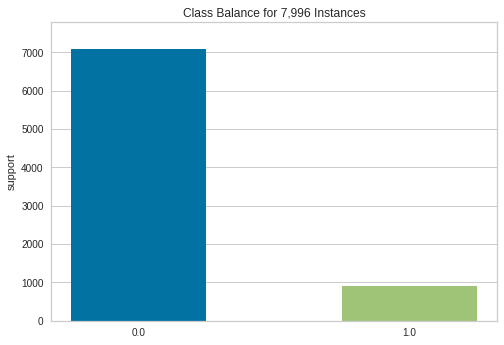

ClassBalance(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fb82fbdadc0>)

In [17]:
class_balance(dataY)

Text(0, 0.5, 'Значения')

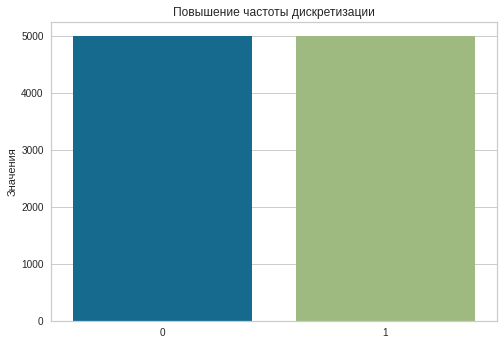

In [18]:
y=upsampled.is_safe.value_counts()
sns.barplot(y=y,x=[0,1])
plt.title('Повышение частоты дискретизации')
plt.ylabel('Значения')

Text(0, 0.5, 'Значения')

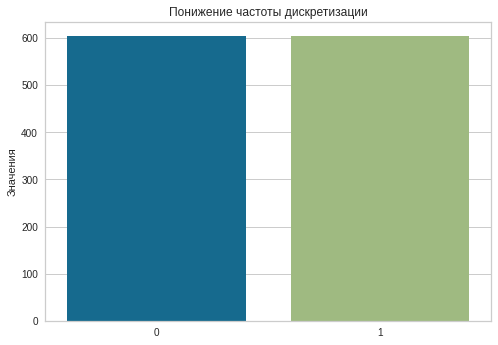

In [19]:
y=downsampled.is_safe.value_counts()
sns.barplot(y=y,x=[0,1])
plt.title('Понижение частоты дискретизации')
plt.ylabel('Значения')

Берем сбалансированные данные для выборок.

In [20]:
dataX = downsampled.drop('is_safe', axis=1)
dataY = downsampled['is_safe']

X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size = 0.4, random_state = 42)

N_train, _ = X_train.shape 
N_test,  _ = X_test.shape

classes = dataY.unique()

# Визуализация данных
Построим диаграмму рассеивания для количественных признаков.


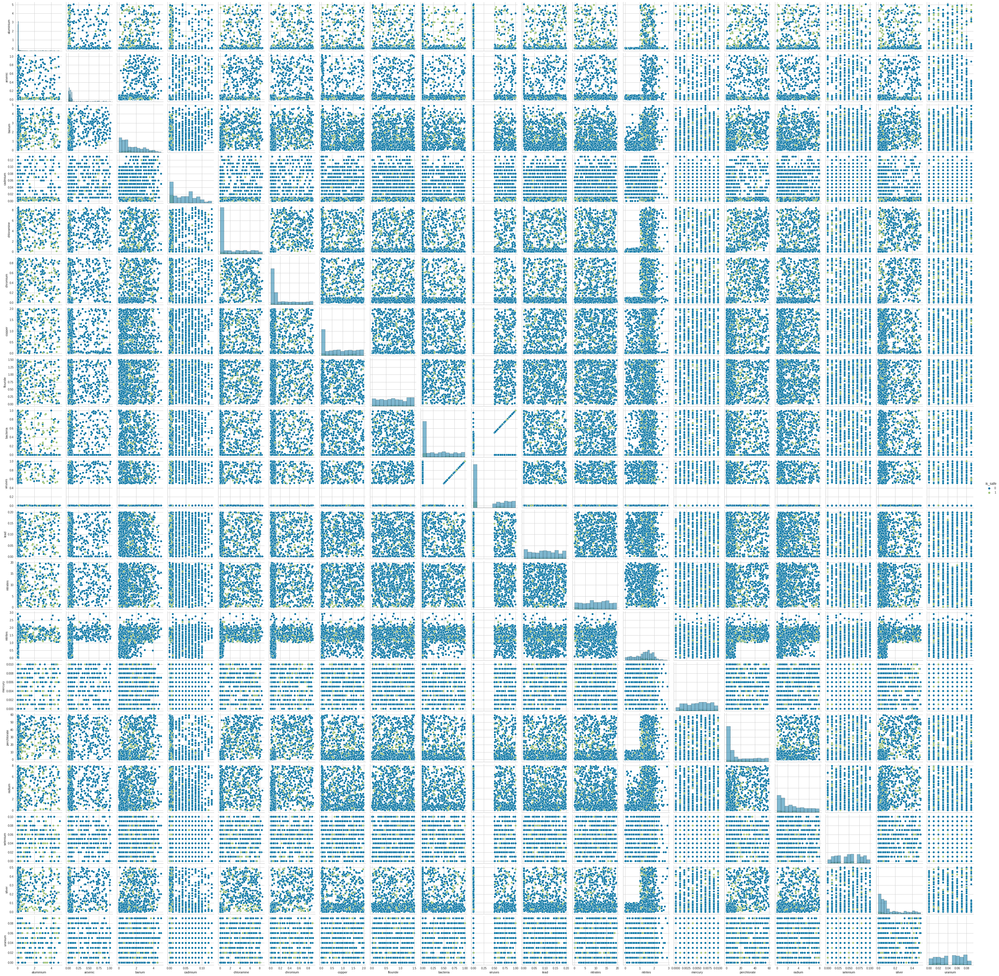

In [38]:
sns.pairplot(data.iloc[np.random.choice(np.arange(data.shape[0]), size=1000, replace=False)], hue='is_safe', diag_kind='hist')
plt.legend()
pass

Из диаграммы видно, что признаки между собой не коррелируют. Построим матрицу корреляции для заданных признаков и ее визуальное представление.

In [ ]:
corr = df.corr() 
corr.style.background_gradient(cmap='coolwarm')

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
aluminium,1.000000,0.067372,0.225725,0.294091,-0.099902,0.369221,0.353134,0.168569,-0.009877,-0.078324,-0.071040,0.020957,-0.003851,0.237439,-0.003129,0.362986,0.243396,-0.003651,0.334923,0.014723
ammonia,0.067372,1.000000,0.046791,0.070108,-0.006415,0.104778,0.124789,0.015952,-0.028221,0.063607,0.105862,-0.037068,0.006484,-0.063306,0.020886,0.090927,0.050406,0.029898,0.075554,0.014639
arsenic,0.225725,0.046791,1.000000,0.362925,0.334782,0.356509,0.312421,-0.036488,0.003731,0.035642,0.011596,-0.087669,0.027533,0.305113,-0.015288,0.332228,0.218328,-0.006993,0.307794,0.001469
barium,0.294091,0.070108,0.362925,1.000000,-0.037901,0.446869,0.415937,0.065277,-0.018637,0.101304,-0.002429,-0.042829,-0.011423,0.312783,0.006165,0.462207,0.286890,0.035222,0.431542,-0.002541
cadmium,-0.099902,-0.006415,0.334782,-0.037901,1.000000,-0.144366,-0.157716,-0.109252,0.005005,-0.092133,0.021255,-0.035313,0.020232,-0.015829,-0.016169,-0.149269,-0.098936,0.009933,-0.155441,-0.005911
chloramine,0.369221,0.104778,0.356509,0.446869,-0.144366,1.000000,0.555846,0.118975,0.004254,0.154443,0.003432,-0.030241,-0.001619,0.379916,-0.021198,0.588683,0.389119,0.011435,0.522372,-0.007648
chromium,0.353134,0.124789,0.312421,0.415937,-0.157716,0.555846,1.000000,0.113003,-0.002424,0.141937,0.002193,-0.050254,-0.012843,0.335940,-0.022541,0.524432,0.315484,0.030598,0.510705,-0.005472
copper,0.168569,0.015952,-0.036488,0.065277,-0.109252,0.118975,0.113003,1.000000,0.011647,0.149271,0.006183,0.121762,0.002259,0.162092,0.017785,0.104527,0.026534,-0.003356,0.089241,0.006802
flouride,-0.009877,-0.028221,0.003731,-0.018637,0.005005,0.004254,-0.002424,0.011647,1.000000,0.013984,0.018261,0.012146,-0.008245,-0.016591,-0.004263,-0.016352,0.007683,0.022726,0.014446,0.016849
bacteria,-0.078324,0.063607,0.035642,0.101304,-0.092133,0.154443,0.141937,0.149271,0.013984,1.000000,0.618535,-0.027179,-0.033993,0.246463,-0.004406,0.147526,0.099080,-0.006779,0.148199,0.045077


Также построим матрицу корреляции всех признаков относительно is_safe.

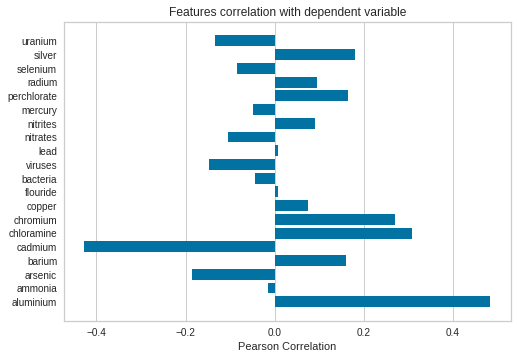

In [ ]:
feature_correlation(dataX, dataY);

Используем PCA с целью визуализации даных в трехмерной проекции.

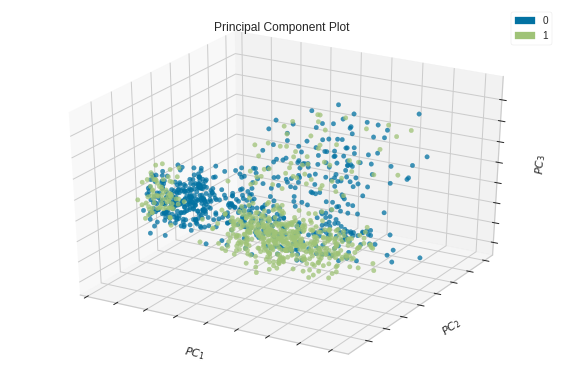

In [ ]:
pca_decomposition(dataX, dataY.astype(int), projection=3);

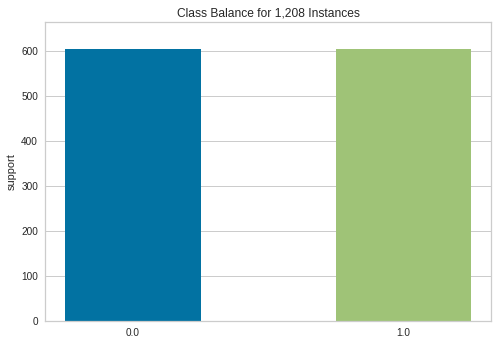

ClassBalance(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f1f43e3d910>)

In [ ]:
class_balance(dataY)

# Стандартизация
Выполним стандартизацию всех признаков.

In [24]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

X_train_std = sc.fit_transform(X_train)
X_validation_std = sc.transform(X_test)

# Обучение модели
## Метод K-ближайших соседей (KNN)

In [36]:
knn_default = KNeighborsClassifier(n_neighbors = 2)
knn_default.fit(X_train, y_train)

knn_training_predict = knn_default.score(X_train, y_train)
knn_test_predict = knn_default.score(X_test, y_test)

err_train = np.mean(y_train != knn_default.predict(X_train))
err_test  = np.mean(y_test  != knn_default.predict(X_test))

print("Accuracy. Train : {:.3f}, Test: {:.3f}. ".format(knn_training_predict, knn_test_predict))
print("Error. Train : {:.3f}, Test: {:.3f}. ".format(err_train, err_test))

Accuracy. Train : 0.834, Test: 0.705. 
Error. Train : 0.166, Test: 0.295. 


Построим матрицу рассогласования.

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


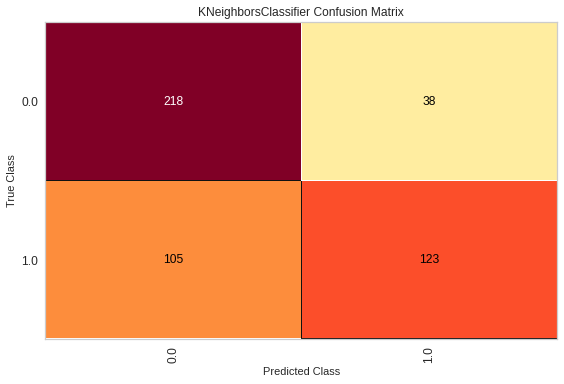

In [ ]:
confusion_matrix(knn_default, X_train, y_train, X_test, y_test, classes=classes);

Построим диаграмму, чтобы увидеть ошибку наглядно.

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


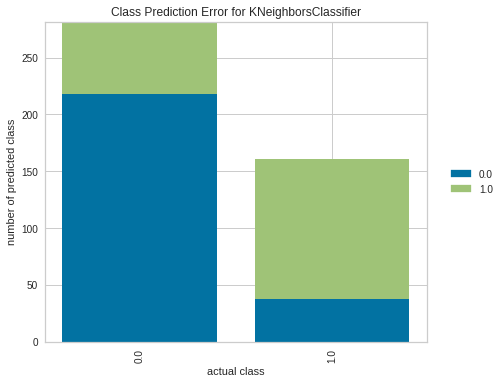

In [ ]:
class_prediction_error(knn_default, X_train, y_train, X_test, y_test, classes=classes);

Рассмотрим и другие значения классификатора.

In [22]:
for i in [ 5, 6, 7, 8, 9, 10]:
    allknn = KNeighborsClassifier(n_neighbors = i)
    allknn.fit(X_train, y_train)

    knn_training_predict = allknn.score(X_train, y_train)
    knn_test_predict = allknn.score(X_test, y_test)

    err_train = np.mean(y_train != allknn.predict(X_train))
    err_test  = np.mean(y_test  != allknn.predict(X_test))

    print("N_neighbors:", i)
    print("Accuracy. Train : {:.3f}, Test: {:.3f}. ".format(knn_training_predict, knn_test_predict))
    print("Error. Train : {:.3f}, Test: {:.3f}. ".format(err_train, err_test))
    print(" ")

N_neighbors: 5
Accuracy. Train : 0.800, Test: 0.783. 
Error. Train : 0.200, Test: 0.217. 
 
N_neighbors: 6
Accuracy. Train : 0.783, Test: 0.785. 
Error. Train : 0.217, Test: 0.215. 
 
N_neighbors: 7
Accuracy. Train : 0.775, Test: 0.789. 
Error. Train : 0.225, Test: 0.211. 
 
N_neighbors: 8
Accuracy. Train : 0.767, Test: 0.775. 
Error. Train : 0.233, Test: 0.225. 
 
N_neighbors: 9
Accuracy. Train : 0.779, Test: 0.789. 
Error. Train : 0.221, Test: 0.211. 
 
N_neighbors: 10
Accuracy. Train : 0.761, Test: 0.779. 
Error. Train : 0.239, Test: 0.221. 
 


## KNN после стандартизации данных

In [ ]:
knn_default_st = KNeighborsClassifier(n_neighbors = 2)
knn_default_st.fit(X_train_std, y_train)

knn_training_predict = knn_default_st.score(X_train_std, y_train)
knn_test_predict = knn_default_st.score(X_validation_std, y_test)

err_train = np.mean(y_train != knn_default_st.predict(X_train_std))
err_test  = np.mean(y_test  != knn_default_st.predict(X_validation_std))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(knn_training_predict, knn_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))

Accuracy. Train : 0.89, Test: 0.77. 
Error. Train : 0.11, Test: 0.23. 


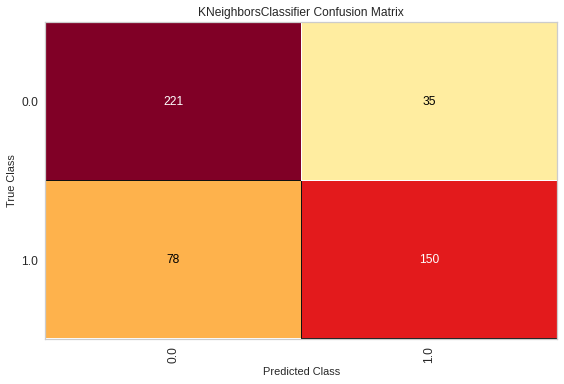

In [ ]:
confusion_matrix(knn_default_st, X_train_std, y_train, X_validation_std, y_test, classes=classes);

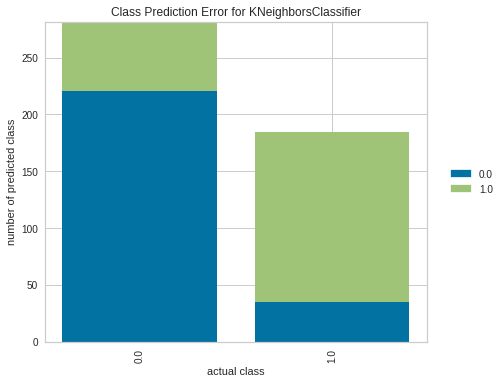

In [ ]:
class_prediction_error(knn_default_st, X_train_std, y_train, X_validation_std, y_test, classes=classes);

# Логистическая регрессия
Возьмем 500 итераций.



In [ ]:
LR = LogisticRegression(max_iter=500)
LR.fit(X_train, y_train)

LR_training_predict = LR.score(X_train, y_train)
LR_test_predict = LR.score(X_test, y_test)

err_train = np.mean(y_train != LR.predict(X_train))
err_test  = np.mean(y_test  != LR.predict(X_test))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(LR_training_predict, LR_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))

Accuracy. Train : 0.77, Test: 0.79. 
Error. Train : 0.23, Test: 0.21. 


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


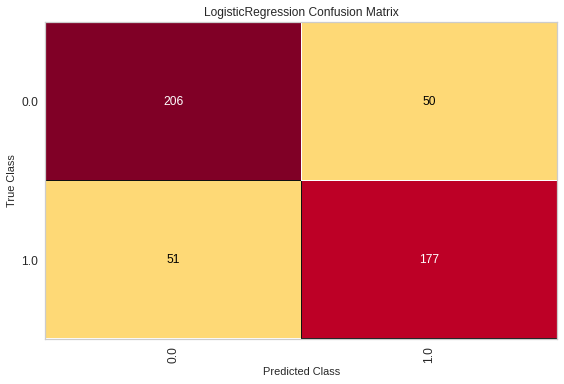

/usr/local/lib/python3.8/dist-packages/pandas/io/formats/format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


ConfusionMatrix(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f1f42463df0>,
                classes=[0.0, 1.0]
Categories (2, float64): [0.0, 1.0],
                cmap=<matplotlib.colors.ListedColormap object at 0x7f1f4245d8b0>,
                estimator=LogisticRegression(max_iter=500))

In [ ]:
confusion_matrix(LR, X_train, y_train, X_test, y_test, classes=classes)

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


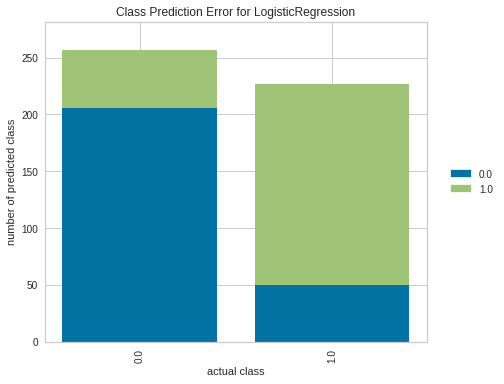

/usr/local/lib/python3.8/dist-packages/pandas/io/formats/format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


ClassPredictionError(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f1f42492190>,
                     classes=[0.0, 1.0]
Categories (2, float64): [0.0, 1.0],
                     estimator=LogisticRegression(max_iter=500))

In [ ]:
class_prediction_error(LR, X_train, y_train, X_test, y_test, classes=classes)

Понизим количество итераций до 200.

In [ ]:
LR = LogisticRegression(max_iter=200)
LR.fit(X_train_std, y_train)

LR_training_predict = LR.score(X_train_std, y_train)
LR_test_predict = LR.score(X_validation_std, y_test)

err_train = np.mean(y_train != LR.predict(X_train_std))
err_test  = np.mean(y_test  != LR.predict(X_validation_std))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(LR_training_predict, LR_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))


Accuracy. Train : 0.79, Test: 0.80. 
Error. Train : 0.21, Test: 0.20. 


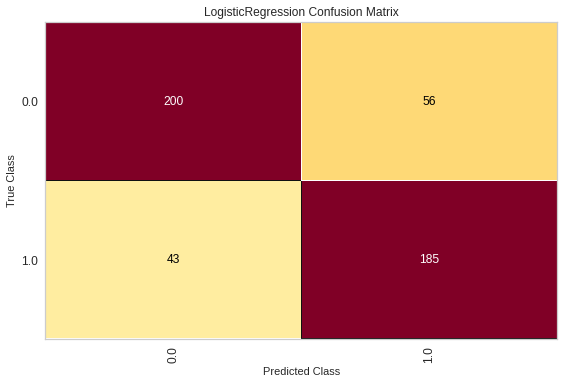

/usr/local/lib/python3.8/dist-packages/pandas/io/formats/format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


ConfusionMatrix(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f1f4234cd30>,
                classes=[0.0, 1.0]
Categories (2, float64): [0.0, 1.0],
                cmap=<matplotlib.colors.ListedColormap object at 0x7f1f423be880>,
                estimator=LogisticRegression(max_iter=200))

In [ ]:
confusion_matrix(LR, X_train_std, y_train, X_validation_std, y_test, classes=classes)

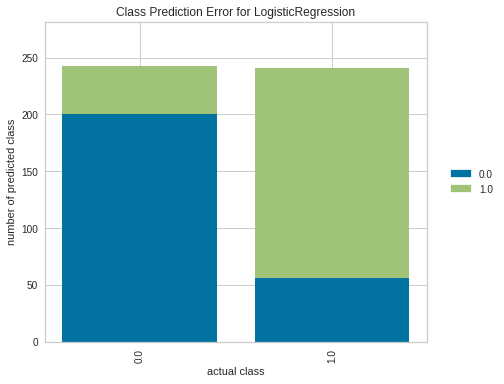

/usr/local/lib/python3.8/dist-packages/pandas/io/formats/format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


ClassPredictionError(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f1f42437a00>,
                     classes=[0.0, 1.0]
Categories (2, float64): [0.0, 1.0],
                     estimator=LogisticRegression(max_iter=200))

In [ ]:
class_prediction_error(LR, X_train_std, y_train, X_validation_std, y_test, classes=classes)

Точность понизилась при уменьшении количества итераций.

# Random Forest

## RF без стандартизации

In [ ]:
# Глубина = 4
RanForest = RandomForestClassifier(n_estimators = 100, max_depth = 4)
RanForest.fit(X_train, y_train)

RanForest_training_predict = RanForest.score(X_train, y_train)
RanForest_test_predict = RanForest.score(X_test, y_test)

err_train = np.mean(y_train != RanForest.predict(X_train))
err_test  = np.mean(y_test  != RanForest.predict(X_test))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(RanForest_training_predict, RanForest_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))

Accuracy. Train : 0.87, Test: 0.85. 
Error. Train : 0.13, Test: 0.15. 


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


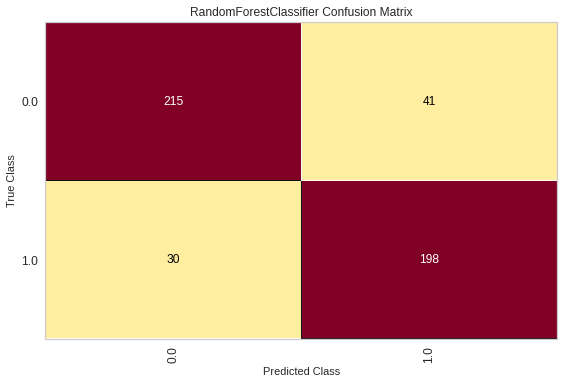

In [ ]:
confusion_matrix(RanForest, X_train, y_train, X_test, y_test, classes=classes);

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


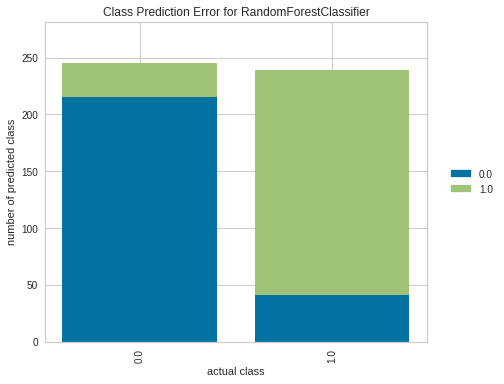

In [ ]:
class_prediction_error(RanForest, X_train, y_train, X_test, y_test, classes=classes);

## RF при стандартизации.

In [ ]:
# Максимальная глубина = 4
RanForest = RandomForestClassifier(n_estimators = 100, max_depth = 4)
RanForest.fit(X_train_std, y_train)

RanForest_training_predict = RanForest.score(X_train_std, y_train)
RanForest_test_predict = RanForest.score(X_validation_std, y_test)

err_train = np.mean(y_train != RanForest.predict(X_train_std))
err_test  = np.mean(y_test  != RanForest.predict(X_validation_std))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(RanForest_training_predict, RanForest_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))

Accuracy. Train : 0.88, Test: 0.87. 
Error. Train : 0.12, Test: 0.13. 


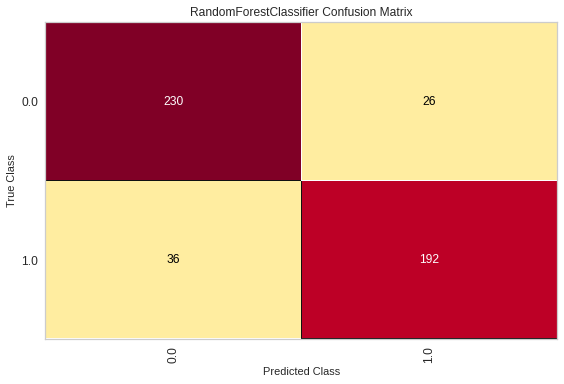

In [ ]:
confusion_matrix(RanForest, X_train_std, y_train, X_validation_std, y_test, classes=classes);

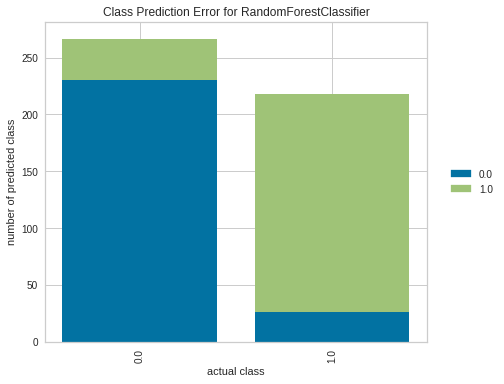

In [ ]:
class_prediction_error(RanForest, X_train_std, y_train, X_validation_std, y_test, classes=classes);

## Измененная максимальная глубина max_depth, без стандартизации.

In [ ]:
RanForest = RandomForestClassifier(n_estimators = 100, max_depth = 15)
RanForest.fit(X_train, y_train)

RanForest_training_predict = RanForest.score(X_train, y_train)
RanForest_test_predict = RanForest.score(X_test, y_test)

err_train = np.mean(y_train != RanForest.predict(X_train))
err_test  = np.mean(y_test  != RanForest.predict(X_test))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(RanForest_training_predict, RanForest_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))

Accuracy. Train : 1.00, Test: 0.90. 
Error. Train : 0.00, Test: 0.10. 


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


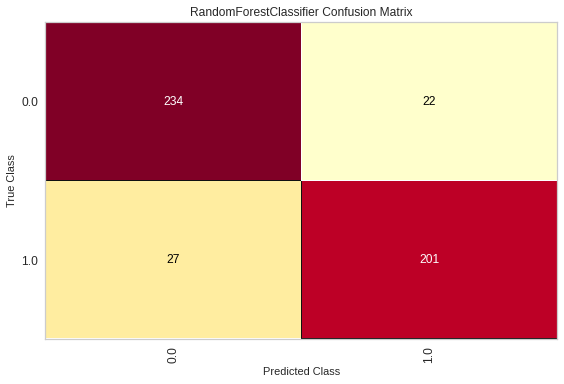

In [ ]:
confusion_matrix(RanForest, X_train, y_train, X_test, y_test, classes=classes);

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


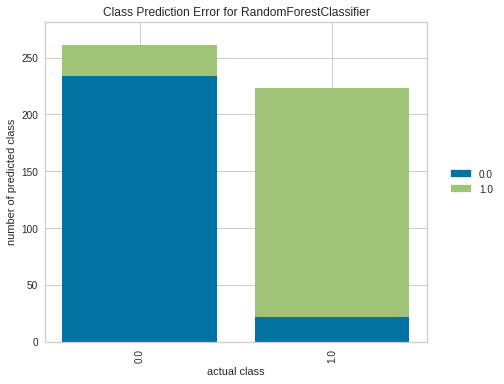

In [ ]:
class_prediction_error(RanForest, X_train, y_train, X_test, y_test, classes=classes);

## Со стандартизацией.

In [ ]:
RanForest = RandomForestClassifier(n_estimators = 100, max_depth = 15)
RanForest.fit(X_train_std, y_train)

RanForest_training_predict = RanForest.score(X_train_std, y_train)
RanForest_test_predict = RanForest.score(X_validation_std, y_test)

err_train = np.mean(y_train != RanForest.predict(X_train_std))
err_test  = np.mean(y_test  != RanForest.predict(X_validation_std))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(RanForest_training_predict, RanForest_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))

Accuracy. Train : 1.00, Test: 0.91. 
Error. Train : 0.00, Test: 0.09. 


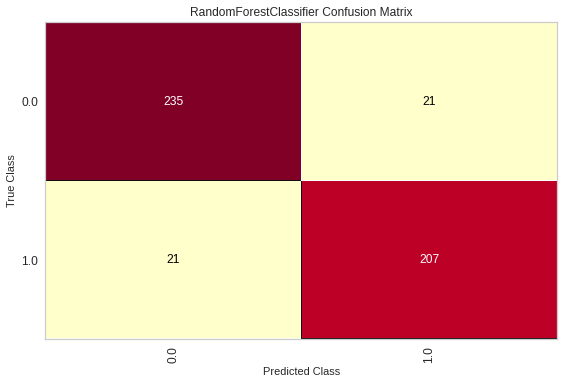

In [ ]:
confusion_matrix(RanForest, X_train_std, y_train, X_validation_std, y_test, classes=classes);

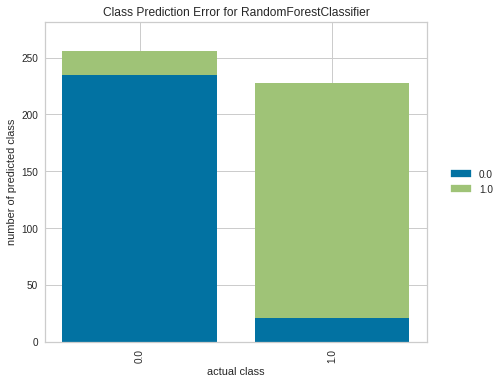

In [ ]:
class_prediction_error(RanForest, X_train_std, y_train, X_validation_std, y_test, classes=classes);

# Gradient Boosting

In [ ]:
GB = GradientBoostingClassifier(n_estimators=100)
GB.fit(X_train, y_train)

GB_training_predict = GB.score(X_train, y_train)
GB_test_predict = GB.score(X_test, y_test)

err_train = np.mean(y_train != GB.predict(X_train))
err_test  = np.mean(y_test  != GB.predict(X_test))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(GB_training_predict, GB_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))

Accuracy. Train : 0.99, Test: 0.91. 
Error. Train : 0.01, Test: 0.09. 


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


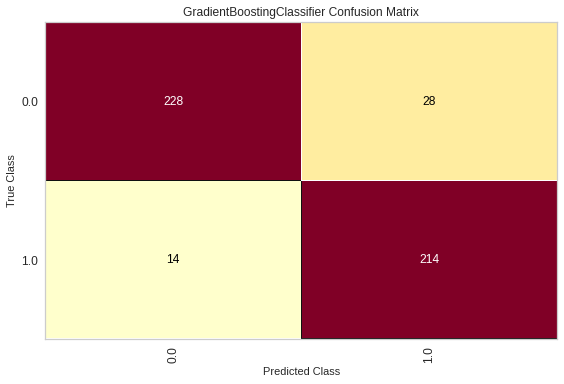

In [ ]:
confusion_matrix(GB, X_train, y_train, X_test, y_test, classes=classes);

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


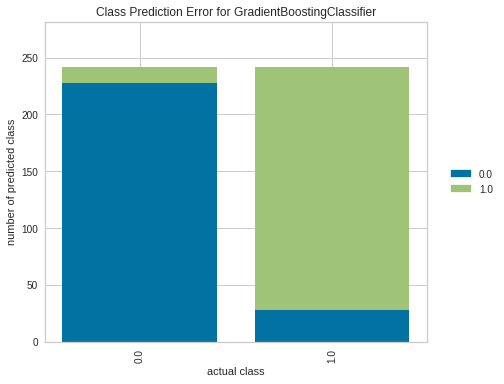

In [ ]:
class_prediction_error(GB, X_train, y_train, X_test, y_test, classes=classes);

## Применив стандартизацию.

In [ ]:
GB = GradientBoostingClassifier(n_estimators=100)
GB.fit(X_train_std, y_train)

GB_training_predict = GB.score(X_train_std, y_train)
GB_test_predict = GB.score(X_validation_std, y_test)

err_train = np.mean(y_train != GB.predict(X_train_std))
err_test  = np.mean(y_test  != GB.predict(X_validation_std))

print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(GB_training_predict, GB_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))

Accuracy. Train : 0.99, Test: 0.91. 
Error. Train : 0.01, Test: 0.09. 


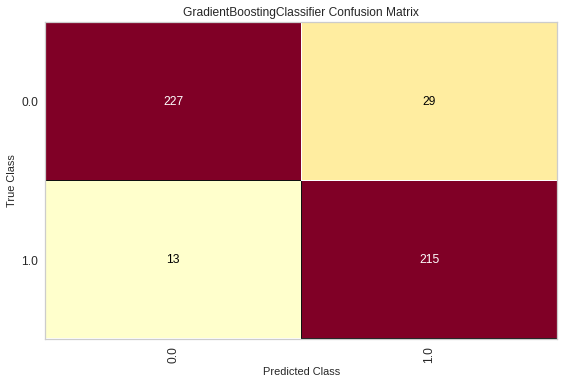

In [ ]:
confusion_matrix(GB, X_train_std, y_train, X_validation_std, y_test, classes=classes);

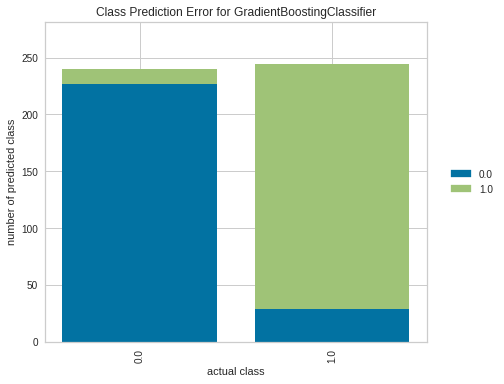

In [ ]:
class_prediction_error(GB, X_train_std, y_train, X_validation_std, y_test, classes=classes);

# NN

In [25]:
# model
NN = MLPClassifier(hidden_layer_sizes=(100,50), max_iter=1000)
NN.fit(X_train_std, y_train)

#score
NN_training_predict = NN.score(X_train_std, y_train)
NN_test_predict = NN.score(X_validation_std, y_test)

# error
err_train = np.mean(y_train != NN.predict(X_train_std))
err_test  = np.mean(y_test  != NN.predict(X_validation_std))

# print
print("Accuracy. Train : {:.2f}, Test: {:.2f}. ".format(NN_training_predict, NN_test_predict))
print("Error. Train : {:.2f}, Test: {:.2f}. ".format(err_train, err_test))

Accuracy. Train : 1.00, Test: 0.89. 
Error. Train : 0.00, Test: 0.11. 


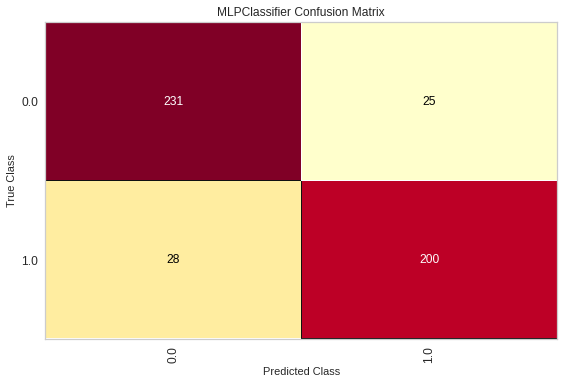

In [26]:
confusion_matrix(NN, X_train_std, y_train,X_validation_std, y_test, classes=classes);

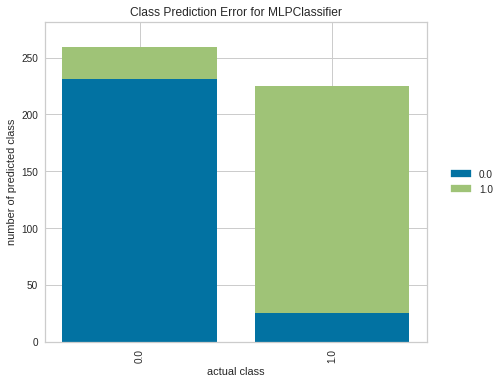

In [27]:
class_prediction_error(NN, X_train_std, y_train, X_validation_std, y_test, classes=classes);

In [28]:
from sklearn.metrics import accuracy_score

In [34]:
np.arange(1, 50, 1)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])

In [35]:
array_neurons = np.arange(1, 50, 1)
test_err = []
train_err = []
train_acc = []
test_acc = []

for neurons in array_neurons:
    mlp_model = MLPClassifier(hidden_layer_sizes=(100,neurons), max_iter=3000)
    mlp_model.fit(X_train_std, y_train)

    y_train_pred = mlp_model.predict(X_train_std)
    y_test_pred = mlp_model.predict(X_validation_std)
    
    train_err.append(np.mean(y_train != y_train_pred))
    test_err.append(np.mean(y_test != y_test_pred))
    
    train_acc.append(accuracy_score(y_train, y_train_pred))
    test_acc.append(accuracy_score(y_test, y_test_pred))

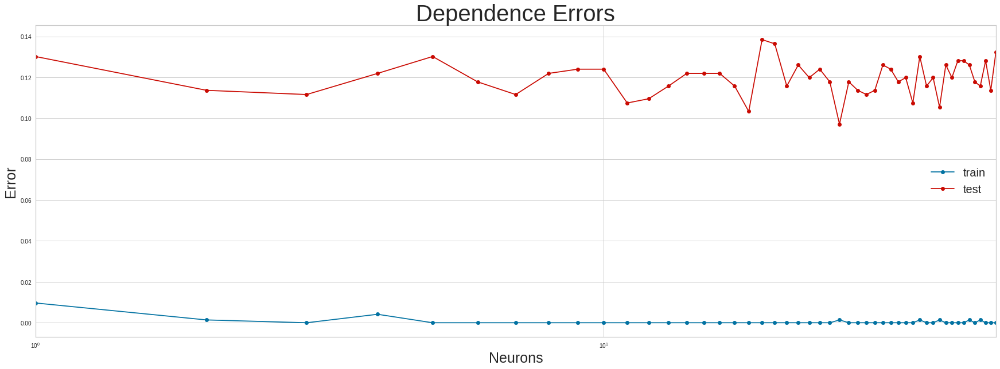

In [37]:
plt.figure(figsize = (30, 10))

plt.semilogx(array_neurons, train_err, 'b-o', label = 'train')
plt.semilogx(array_neurons, test_err, 'r-o', label = 'test')

plt.xlim([np.min(array_neurons), np.max(array_neurons)])

plt.title('Dependence Errors', fontsize = 40)
plt.xlabel('Neurons', fontsize = 25)
plt.ylabel('Error', fontsize = 25)

plt.legend(fontsize = 20)

In [31]:
num_elems_arr = [x for x in range(1, 30, 1)]
alpha_arr = np.logspace(-3, 2, 5)
test_err = []
train_err = []
train_acc = []
test_acc = []

alpha_opts = []
min_test_errors = []
min_train_errors = []
min_test_accuracy = []
min_train_accuracy = []

for index, neurons in enumerate(num_elems_arr):

    test_err.append(np.array([]))
    train_err.append(np.array([]))
    train_acc.append(np.array([]))
    test_acc.append(np.array([]))

    for alpha in alpha_arr:

        mlp_model = MLPClassifier(alpha = alpha, hidden_layer_sizes=(100, neurons), max_iter=3000)
        mlp_model.fit(X_train_std, y_train)

        y_train_pred = mlp_model.predict(X_train_std)
        y_test_pred = mlp_model.predict(X_validation_std)

        train_err[index] = np.append(train_err[index], np.mean(y_train != y_train_pred))
        test_err[index] = np.append(test_err[index], np.mean(y_test != y_test_pred))

        train_acc[index] = np.append(train_acc[index], accuracy_score(y_train, y_train_pred))
        test_acc[index] = np.append(test_acc[index], accuracy_score(y_test, y_test_pred))

    min_test_err = np.min(test_err[index])
    alpha_opts.append(alpha_arr[test_err[index] == min_test_err])

    min_test_errors.append(min_test_err)
    tmp = test_err[index] == min_test_err

    min_train_errors.append(train_err[index][test_err[index] == min_test_err][0])
    min_test_accuracy.append(test_acc[index][test_err[index] == min_test_err][0])
    min_train_accuracy.append(train_acc[index][test_err[index] == min_test_err][0])

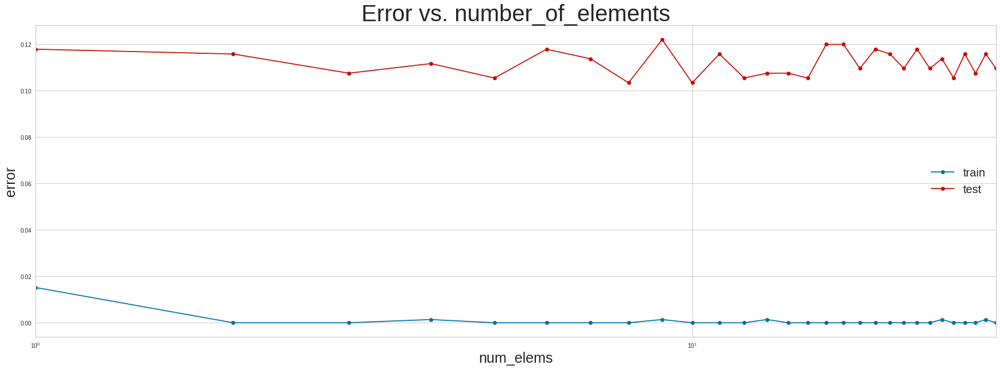

In [33]:
plt.figure(figsize = (30, 10))

plt.semilogx(num_elems_arr, min_train_errors, 'b-o', label = 'train')
plt.semilogx(num_elems_arr, min_test_errors, 'r-o', label = 'test')

plt.xlim([np.min(num_elems_arr), np.max(num_elems_arr)])

plt.title('Error vs. number_of_elements', fontsize = 40)
plt.xlabel('num_elems', fontsize = 25)
plt.ylabel('error', fontsize = 25)

plt.legend(fontsize = 20)

В данной лабораторной работе был представлен анализ данных качества воды, а также решена задача классификации (безопасна ли вода или нет) с помощью модели, натренированной методом К-ближайших соседей.

Перед тем, как тренировать модель, нужно проанализировать данные и их подготовить:

* Вычислить основные характеристики и проанализировать их.
* Проверить на наличие пропущенных значений.
* Подготовить категориальные признаки, мы проводили бинаризацию признаков.
* Провести нормализацию количественных признаков с помощью стандартизации.
* Разбить данные на обучающую и тестовую выборку.
* Выполнить алгоритм классификации и проверить качество полученной модели.
При классификаторе с количеством соседей k = 2 было получено наиболее удачное значение точности тестовой и тренировочной выборок в сравнении с другими значениями классификатора.

Также в данной работе представлены следующие алгоритмы обучения данных:
1.   Логистическая регрессия
2.   Random Forest
3.   Gradient Boosting

и обучена 2-х слойная нейронная сеть (NN).

Были построены матрицы рассогласования для каждого из методов, по которым можно было сказать, где чаще всего совершаются ошибки. 
Лучше всего себя показал алгоритм Gradient Boosting. Он показал ошибку на тестовой выборке в 9% против:
* 11% у нейронной сети (NN), 
* 15% у Random Forest,
* 21% у логистической регрессии.

 Хуже всего выглядит алгорим ближайших соседей, ошибка на тестовой выборке которого составляет почти 30%. 
